### Importing the required libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.metrics import make_scorer, r2_score, mean_absolute_error, mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Lasso, Ridge, ElasticNet
from sklearn.model_selection import train_test_split


In [ ]:
df = pd.read_csv('/content/train.csv')
df

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
0,4,88.944468,57.862692,66.361592,36.116612,1.181795,1.062396,122.90607,31.794921,51.968828,...,2.257143,2.213364,2.219783,1.368922,1.066221,1,1.085714,0.433013,0.437059,29.00
1,5,92.729214,58.518416,73.132787,36.396602,1.449309,1.057755,122.90607,36.161939,47.094633,...,2.257143,1.888175,2.210679,1.557113,1.047221,2,1.128571,0.632456,0.468606,26.00
2,4,88.944468,57.885242,66.361592,36.122509,1.181795,0.975980,122.90607,35.741099,51.968828,...,2.271429,2.213364,2.232679,1.368922,1.029175,1,1.114286,0.433013,0.444697,19.00
3,4,88.944468,57.873967,66.361592,36.119560,1.181795,1.022291,122.90607,33.768010,51.968828,...,2.264286,2.213364,2.226222,1.368922,1.048834,1,1.100000,0.433013,0.440952,22.00
4,4,88.944468,57.840143,66.361592,36.110716,1.181795,1.129224,122.90607,27.848743,51.968828,...,2.242857,2.213364,2.206963,1.368922,1.096052,1,1.057143,0.433013,0.428809,23.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21258,4,106.957877,53.095769,82.515384,43.135565,1.177145,1.254119,146.88130,15.504479,65.764081,...,3.555556,3.223710,3.519911,1.377820,0.913658,1,2.168889,0.433013,0.496904,2.44
21259,5,92.266740,49.021367,64.812662,32.867748,1.323287,1.571630,188.38390,7.353333,69.232655,...,2.047619,2.168944,2.038991,1.594167,1.337246,1,0.904762,0.400000,0.212959,122.10
21260,2,99.663190,95.609104,99.433882,95.464320,0.690847,0.530198,13.51362,53.041104,6.756810,...,4.800000,4.472136,4.781762,0.686962,0.450561,1,3.200000,0.500000,0.400000,1.98
21261,2,99.663190,97.095602,99.433882,96.901083,0.690847,0.640883,13.51362,31.115202,6.756810,...,4.690000,4.472136,4.665819,0.686962,0.577601,1,2.210000,0.500000,0.462493,1.84


### Getting to know about our dataset

In [ ]:
df.shape

(21263, 82)

Atomic Mass-Related Columns

number_of_elements
Total count of elements present in a compound.

mean_atomic_mass
Arithmetic mean of the atomic masses of all elements in the compound.

wtd_mean_atomic_mass
Weighted average of the atomic masses of elements in the compound, weighted by their proportions or contributions.

gmean_atomic_mass
Geometric mean of atomic masses of the elements in the compound.

wtd_gmean_atomic_mass
Weighted geometric mean of atomic masses, considering the relative significance of each element.

entropy_atomic_mass
Entropy of atomic mass distribution, indicating the variability or diversity of atomic masses in the compound.

wtd_entropy_atomic_mass
Weighted entropy of atomic mass, incorporating the contribution of each element.
range_atomic_mass

Difference between the maximum and minimum atomic masses of the elements.
wtd_range_atomic_mass

Weighted range of atomic masses, considering relative element importance.
std_atomic_mass

Standard deviation of atomic masses, showing the spread of masses in the compound.
wtd_std_atomic_mass

Weighted standard deviation of atomic masses.
Ionization Energy (FIE)-Related Columns
mean_fie

Arithmetic mean of the first ionization energy values for elements in the compound.
wtd_mean_fie

Weighted mean of first ionization energy values, emphasizing significant elements.
gmean_fie

Geometric mean of first ionization energy values.
wtd_gmean_fie

Weighted geometric mean of first ionization energy values.
entropy_fie

Entropy of first ionization energy distribution.
wtd_entropy_fie

Weighted entropy of first ionization energy distribution.
range_fie

Difference between the highest and lowest first ionization energy values.
wtd_range_fie

Weighted range of first ionization energy values.
std_fie

Standard deviation of first ionization energy values.
wtd_std_fie

Weighted standard deviation of first ionization energy values.
Atomic Radius-Related Columns
mean_atomic_radius

Arithmetic mean of atomic radii of elements in the compound.
wtd_mean_atomic_radius

Weighted mean of atomic radii.
gmean_atomic_radius

Geometric mean of atomic radii.
wtd_gmean_atomic_radius

Weighted geometric mean of atomic radii.
entropy_atomic_radius

Entropy of atomic radius distribution.
wtd_entropy_atomic_radius

Weighted entropy of atomic radius distribution.
range_atomic_radius

Difference between the largest and smallest atomic radii.
wtd_range_atomic_radius

Weighted range of atomic radii.
std_atomic_radius

Standard deviation of atomic radii.
wtd_std_atomic_radius

Weighted standard deviation of atomic radii.
Density-Related Columns
mean_Density

Average density of elements in the compound.
wtd_mean_Density

Weighted mean of densities of elements.
gmean_Density

Geometric mean of densities.
wtd_gmean_Density

Weighted geometric mean of densities.
entropy_Density

Entropy of density distribution.
wtd_entropy_Density

Weighted entropy of density distribution.
range_Density

Difference between the maximum and minimum densities.
wtd_range_Density

Weighted range of densities.
std_Density

Standard deviation of densities.
wtd_std_Density

Weighted standard deviation of densities.
Electron Affinity-Related Columns
mean_ElectronAffinity

Average electron affinity of elements in the compound.
wtd_mean_ElectronAffinity

Weighted mean of electron affinities.
gmean_ElectronAffinity

Geometric mean of electron affinities.
wtd_gmean_ElectronAffinity

Weighted geometric mean of electron affinities.
entropy_ElectronAffinity

Entropy of electron affinity distribution.
wtd_entropy_ElectronAffinity

Weighted entropy of electron affinity distribution.
range_ElectronAffinity

Difference between the highest and lowest electron affinities.
wtd_range_ElectronAffinity

Weighted range of electron affinities.
std_ElectronAffinity

Standard deviation of electron affinities.
wtd_std_ElectronAffinity

Weighted standard deviation of electron affinities.
Fusion Heat-Related Columns
mean_FusionHeat

Average heat of fusion for elements in the compound.
wtd_mean_FusionHeat

Weighted mean of heat of fusion values.
gmean_FusionHeat

Geometric mean of heat of fusion values.
wtd_gmean_FusionHeat

Weighted geometric mean of heat of fusion values.
entropy_FusionHeat

Entropy of heat of fusion distribution.
wtd_entropy_FusionHeat

Weighted entropy of heat of fusion distribution.
range_FusionHeat

Difference between maximum and minimum heat of fusion values.
wtd_range_FusionHeat

Weighted range of heat of fusion values.
std_FusionHeat

Standard deviation of heat of fusion values.
wtd_std_FusionHeat

Weighted standard deviation of heat of fusion values.
Thermal Conductivity-Related Columns
mean_ThermalConductivity

Average thermal conductivity of elements in the compound.
wtd_mean_ThermalConductivity

Weighted mean of thermal conductivities.
gmean_ThermalConductivity

Geometric mean of thermal conductivities.
wtd_gmean_ThermalConductivity

Weighted geometric mean of thermal conductivities.
entropy_ThermalConductivity

Entropy of thermal conductivity distribution.
wtd_entropy_ThermalConductivity

Weighted entropy of thermal conductivity distribution.
range_ThermalConductivity

Difference between maximum and minimum thermal conductivity values.
wtd_range_ThermalConductivity

Weighted range of thermal conductivities.
std_ThermalConductivity

Standard deviation of thermal conductivities.
wtd_std_ThermalConductivity

Weighted standard deviation of thermal conductivities.
Valence-Related Columns
mean_Valence

Average valence (bonding capacity) of elements in the compound.
wtd_mean_Valence

Weighted mean of valences.
gmean_Valence

Geometric mean of valences.
wtd_gmean_Valence

Weighted geometric mean of valences.
entropy_Valence

Entropy of valence distribution.
wtd_entropy_Valence

Weighted entropy of valence distribution.
range_Valence

Difference between the highest and lowest valences.
wtd_range_Valence

Weighted range of valences.
std_Valence

Standard deviation of valences.
wtd_std_Valence

Weighted standard deviation of valences.
Critical Temperature
critical_temp
The critical temperature (target variable), likely representing the temperature at which the material undergoes a phase transition, such as superconductivity.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21263 entries, 0 to 21262
Data columns (total 82 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   number_of_elements               21263 non-null  int64  
 1   mean_atomic_mass                 21263 non-null  float64
 2   wtd_mean_atomic_mass             21263 non-null  float64
 3   gmean_atomic_mass                21263 non-null  float64
 4   wtd_gmean_atomic_mass            21263 non-null  float64
 5   entropy_atomic_mass              21263 non-null  float64
 6   wtd_entropy_atomic_mass          21263 non-null  float64
 7   range_atomic_mass                21263 non-null  float64
 8   wtd_range_atomic_mass            21263 non-null  float64
 9   std_atomic_mass                  21263 non-null  float64
 10  wtd_std_atomic_mass              21263 non-null  float64
 11  mean_fie                         21263 non-null  float64
 12  wtd_mean_fie      

In [ ]:
missing_values = df.isnull().sum()
print("Missing values in each column:\n", missing_values)

Missing values in each column:
 number_of_elements       0
mean_atomic_mass         0
wtd_mean_atomic_mass     0
gmean_atomic_mass        0
wtd_gmean_atomic_mass    0
                        ..
range_Valence            0
wtd_range_Valence        0
std_Valence              0
wtd_std_Valence          0
critical_temp            0
Length: 82, dtype: int64


## EDA

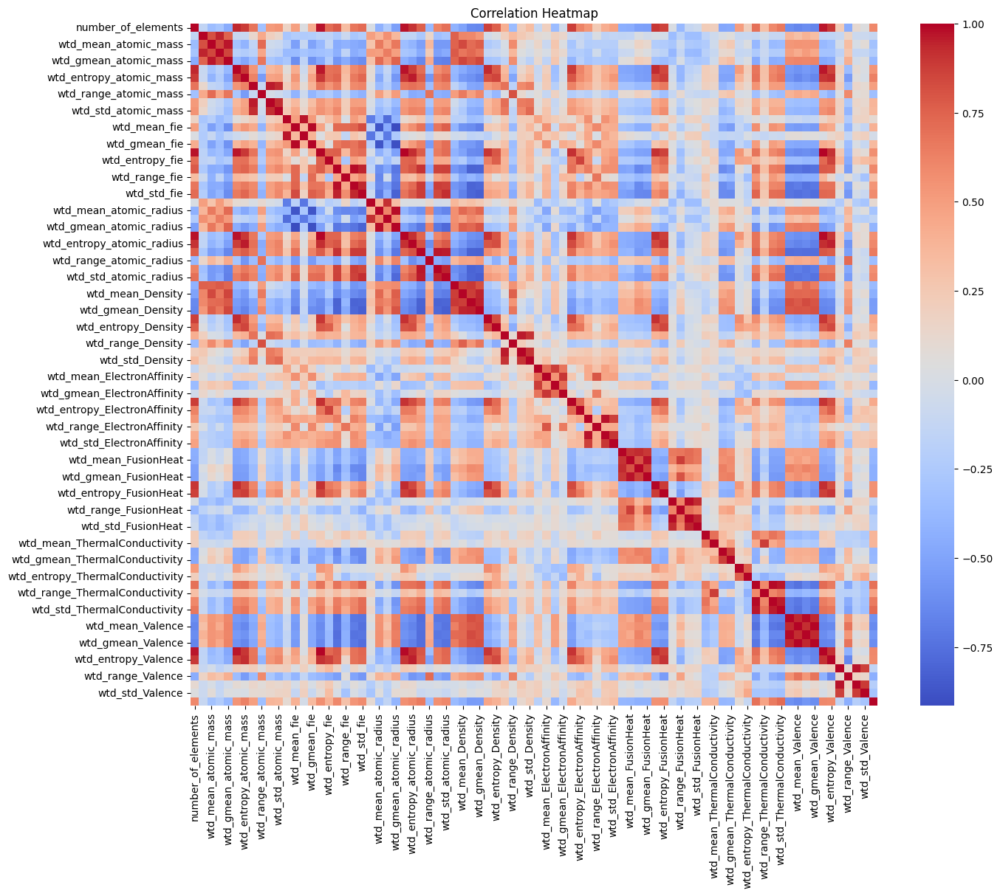

In [ ]:
correlation_matrix = df.corr()

plt.figure(figsize=(15, 12))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()


In [ ]:
threshold = 0.8

high_corr = correlation_matrix.abs().unstack().sort_values(ascending=False)
high_corr = high_corr[high_corr != 1]
print("Highly correlated pairs (above threshold):\n")
print(high_corr[high_corr > threshold])


Highly correlated pairs (above threshold):

entropy_atomic_radius   entropy_fie               0.997739
entropy_fie             entropy_atomic_radius     0.997739
wtd_mean_Valence        wtd_gmean_Valence         0.994939
wtd_gmean_Valence       wtd_mean_Valence          0.994939
entropy_Valence         entropy_fie               0.992726
                                                    ...   
gmean_Density           std_atomic_radius         0.803543
range_fie               wtd_gmean_Density         0.802732
wtd_gmean_Density       range_fie                 0.802732
entropy_Density         wtd_entropy_FusionHeat    0.802633
wtd_entropy_FusionHeat  entropy_Density           0.802633
Length: 318, dtype: float64


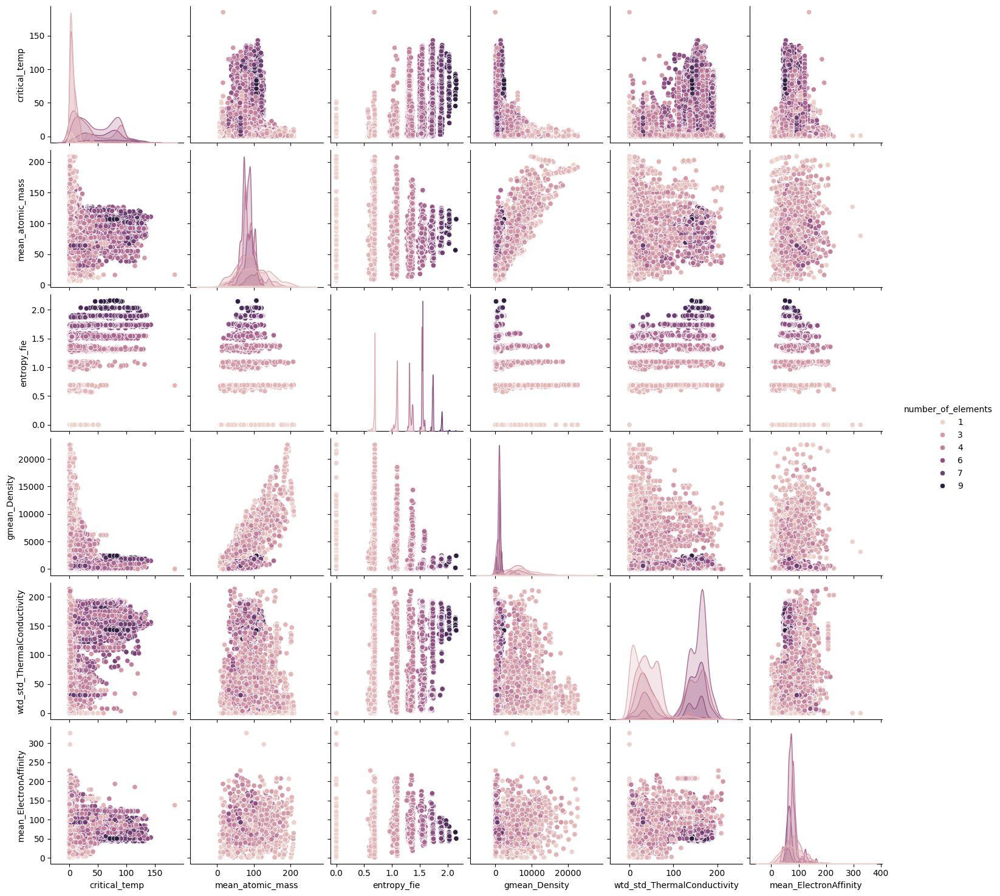

In [ ]:
selected_columns = ['critical_temp', 'mean_atomic_mass', 'entropy_fie',
                    'gmean_Density', 'wtd_std_ThermalConductivity', 'mean_ElectronAffinity']

sns.pairplot(df, vars=selected_columns, hue='number_of_elements')

plt.show()



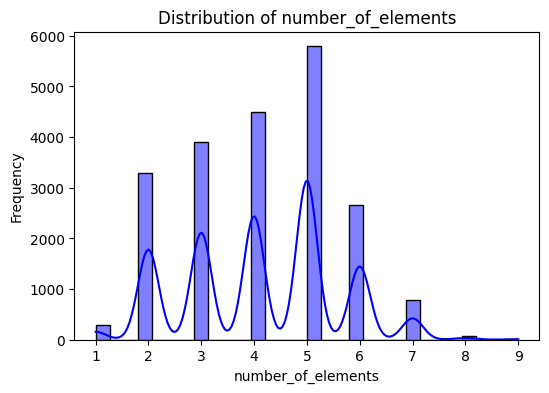

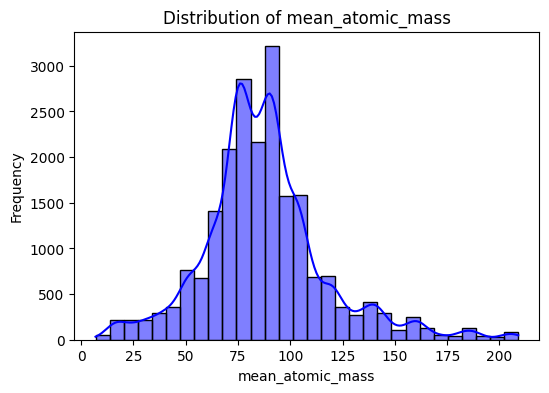

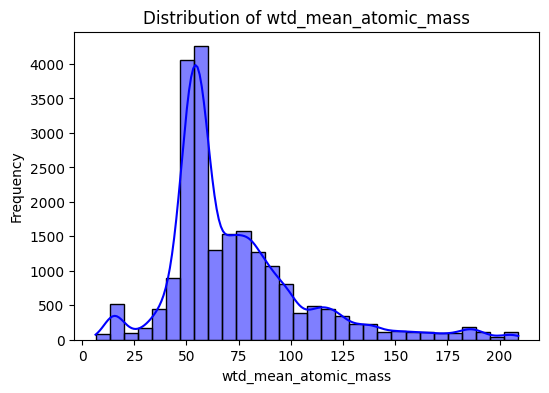

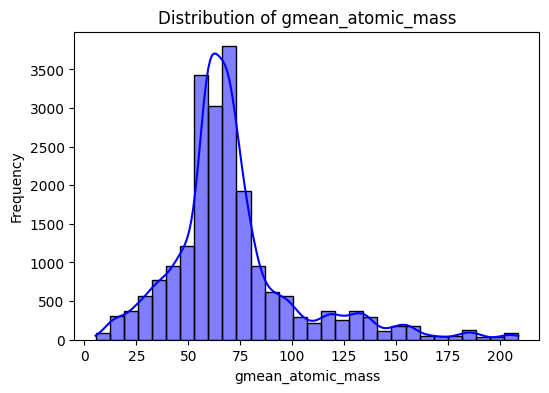

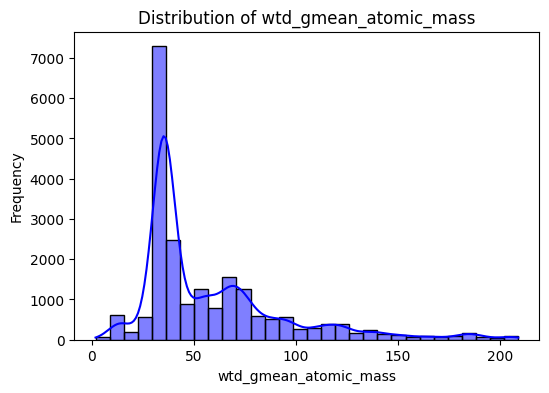

...

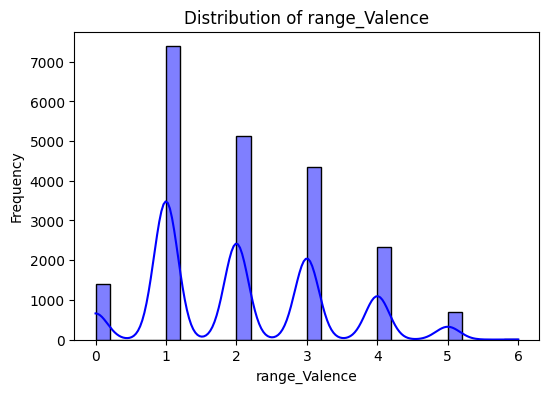

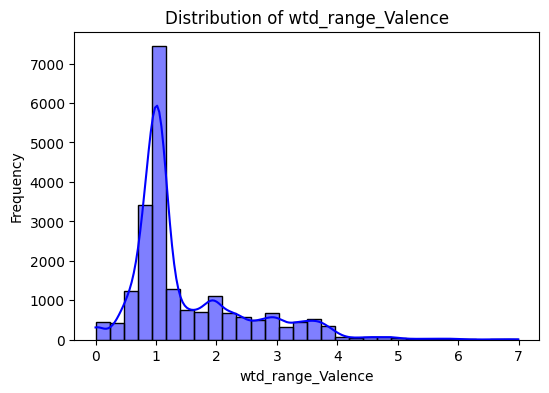

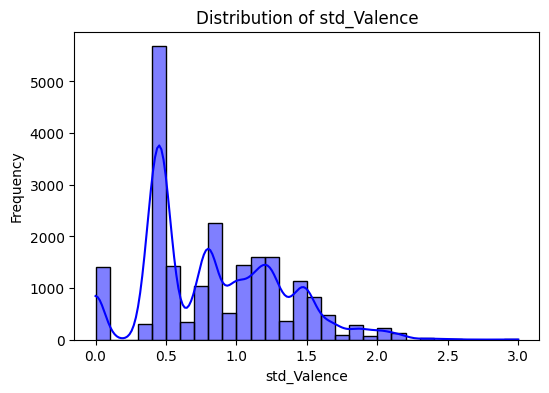

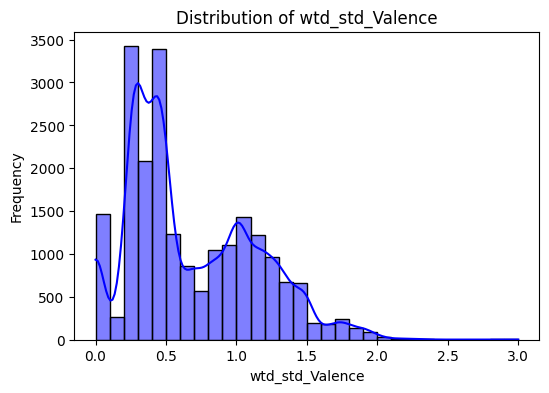

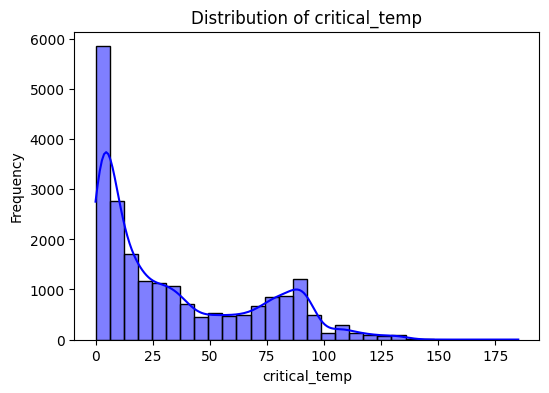

In [ ]:
for col in df.columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col], kde=True, bins=30, color='blue')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()


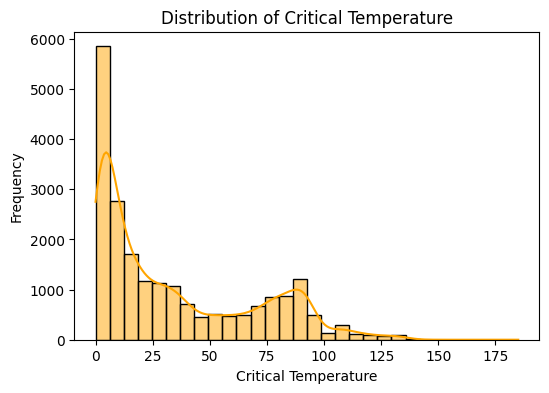

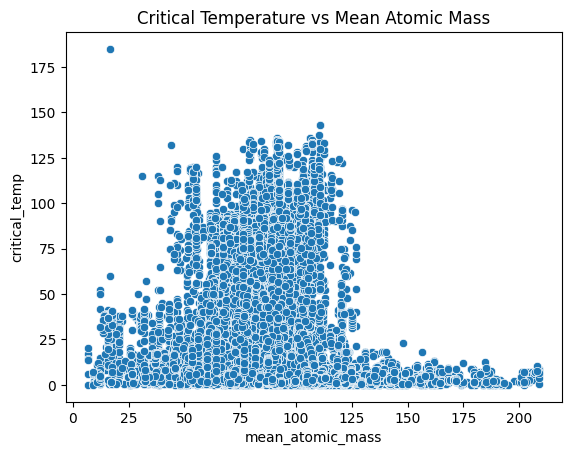

In [ ]:
plt.figure(figsize=(6, 4))
sns.histplot(df['critical_temp'], kde=True, color='orange', bins=30)
plt.title('Distribution of Critical Temperature')
plt.xlabel('Critical Temperature')
plt.ylabel('Frequency')
plt.show()
sns.scatterplot(data=df, x='mean_atomic_mass', y='critical_temp')
plt.title('Critical Temperature vs Mean Atomic Mass')
plt.show()


In [ ]:
correlation_matrix = df.corr()

threshold = 0.75

high_corr_pairs = [
    (col1, col2)
    for col1 in correlation_matrix.columns
    for col2 in correlation_matrix.columns
    if col1 != col2 and correlation_matrix.loc[col1, col2] > threshold
]

unique_pairs = set(tuple(sorted(pair)) for pair in high_corr_pairs)

print(f"Highly correlated pairs (correlation > {threshold}):")
for pair in unique_pairs:
    print(pair)

Highly correlated pairs (correlation > 0.75):
('entropy_FusionHeat', 'wtd_entropy_Valence')
('number_of_elements', 'wtd_entropy_Density')
('entropy_Valence', 'number_of_elements')
('wtd_gmean_atomic_mass', 'wtd_mean_atomic_mass')
('entropy_Valence', 'entropy_atomic_mass')
('wtd_entropy_atomic_mass', 'wtd_entropy_atomic_radius')
('wtd_gmean_fie', 'wtd_std_fie')
('entropy_Valence', 'entropy_fie')
('range_fie', 'std_fie')
('wtd_gmean_Valence', 'wtd_mean_Valence')
('range_Density', 'wtd_std_Density')
('wtd_mean_fie', 'wtd_std_atomic_radius')
('entropy_ElectronAffinity', 'entropy_fie')
('range_FusionHeat', 'std_FusionHeat')
('wtd_gmean_Density', 'wtd_gmean_atomic_mass')
('mean_FusionHeat', 'wtd_mean_FusionHeat')
('mean_FusionHeat', 'wtd_gmean_FusionHeat')
('mean_Valence', 'wtd_mean_Valence')
('entropy_Density', 'wtd_entropy_FusionHeat')
('wtd_gmean_Density', 'wtd_mean_atomic_mass')
('mean_Density', 'mean_atomic_mass')
('entropy_atomic_radius', 'wtd_entropy_atomic_mass')
('number_of_elements

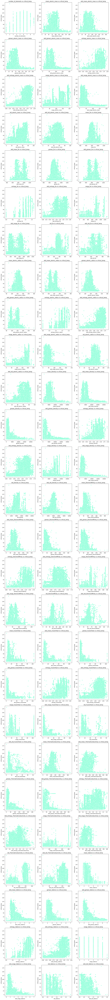

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the target variable
target = 'critical_temp'

# Create scatter plots for each feature against the target variable
features = [col for col in df.columns if col != target]

# Set up the figure
num_features = len(features)
cols = 3  # Number of columns in the plot grid
rows = (num_features + cols - 1) // cols  # Calculate rows based on the number of features
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 5))

# Flatten axes for easier indexing
axes = axes.flatten()

for i, feature in enumerate(features):
    sns.scatterplot(data=df, x=feature, y=target, ax=axes[i], color='aquamarine')
    axes[i].set_title(f"{feature} vs {target}", fontsize=12)
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel(target)

# Remove unused subplots
for i in range(len(features), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()


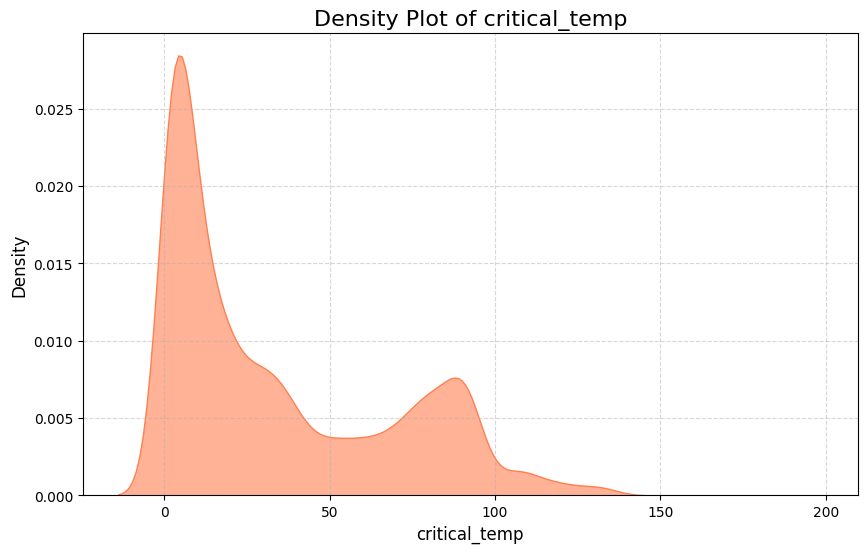

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the target variable
target = 'critical_temp'

# Create a density plot
plt.figure(figsize=(10, 6))
sns.kdeplot(data=df, x=target, fill=True, color='coral', alpha=0.6)
plt.title(f"Density Plot of {target}", fontsize=16)
plt.xlabel(target, fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(visible=True, linestyle='--', alpha=0.5)
plt.show()


## Model implementation


In [ ]:
X = df.drop(columns=['critical_temp'])
y = df['critical_temp']


In [ ]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)


X_train shape: (17010, 81)
X_test shape: (4253, 81)
y_train shape: (17010,)
y_test shape: (4253,)


In [ ]:
scoring_metrics = {
    'R2': make_scorer(r2_score),
    'MAE': make_scorer(mean_absolute_error),
    'RMSE': make_scorer(lambda y_true, y_pred: np.sqrt(mean_squared_error(y_true, y_pred))),
}

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
poly_pipeline = Pipeline([
    ('lin_reg', LinearRegression())
])

# Perform 15-Fold Cross-Validation on training set
poly_results = cross_validate(poly_pipeline, X_scaled, y_train, cv=15, scoring=scoring_metrics, return_train_score=False)

# Print cross-validation metrics (Validation Set)
print("Linear Regression Results (15-Fold Cross-Validation - Validation Set):")
for metric, values in poly_results.items():
    if 'test' in metric:
        print(f"Validation {metric.replace('test_', '')}: {values.mean():.4f}")

# Train on the full training set and evaluate on test set
poly_pipeline.fit(X_scaled, y_train)
y_pred_test = poly_pipeline.predict(X_test_scaled)

# Compute test metrics using the same scoring_metrics dictionary
test_metrics = {name: scorer._score_func(y_test, y_pred_test) for name, scorer in scoring_metrics.items()}

# Print test set metrics separately
print("\nLinear Regression Results (Test Set):")
for metric, value in test_metrics.items():
    print(f"Test {metric}: {value:.4f}")

Linear Regression Results (15-Fold Cross-Validation - Validation Set):
Validation R2: 0.7341
Validation MAE: 13.3820
Validation RMSE: 17.6762

Linear Regression Results (Test Set):
Test R2: 0.7376
Test MAE: 13.2105
Test RMSE: 17.3784


In [ ]:
# Define models
lasso_pipeline = Pipeline([('lasso', Lasso(alpha=0.1, max_iter=1000, random_state=42))])
ridge_pipeline = Pipeline([('ridge', Ridge(alpha=0.1, random_state=42))])
elasticnet_pipeline = Pipeline([('elasticnet', ElasticNet(alpha=0.1, l1_ratio=0.5, max_iter=1000, random_state=42))])

# Cross-validation for training data
lasso_results = cross_validate(lasso_pipeline, X_scaled, y_train, cv=15, scoring=scoring_metrics, return_train_score=False)
ridge_results = cross_validate(ridge_pipeline, X_scaled, y_train, cv=15, scoring=scoring_metrics, return_train_score=False)
elasticnet_results = cross_validate(elasticnet_pipeline, X_scaled, y_train, cv=15, scoring=scoring_metrics, return_train_score=False)

# Train models and get test predictions
models = {'Lasso': lasso_pipeline, 'Ridge': ridge_pipeline, 'ElasticNet': elasticnet_pipeline}
test_predictions = {}

for name, model in models.items():
    model.fit(X_scaled, y_train)
    y_pred_test = model.predict(X_test_scaled)
    test_predictions[name] = y_pred_test

# Compute test set RMSE
test_rmse = {name: np.sqrt(mean_squared_error(y_test, y_pred)) for name, y_pred in test_predictions.items()}

# Print validation & test results
for name, results in zip(['Lasso', 'Ridge', 'ElasticNet'], [lasso_results, ridge_results, elasticnet_results]):
    print(f"\n{name} Regression Results (Validation Set, 15-Fold Cross-Validation):")
    for metric, values in results.items():
        if 'test' in metric:
            print(f"Validation {metric.replace('test_', '')}: {values.mean():.4f}")

    print(f"Test RMSE: {test_rmse[name]:.4f}")


Lasso Regression Results (Validation Set, 15-Fold Cross-Validation):
Validation R2: 0.7088
Validation MAE: 14.0944
Validation RMSE: 18.5011
Test RMSE: 18.1323

Ridge Regression Results (Validation Set, 15-Fold Cross-Validation):
Validation R2: 0.7341
Validation MAE: 13.3808
Validation RMSE: 17.6760
Test RMSE: 17.3824

ElasticNet Regression Results (Validation Set, 15-Fold Cross-Validation):
Validation R2: 0.6936
Validation MAE: 14.5954
Validation RMSE: 18.9789
Test RMSE: 18.4610


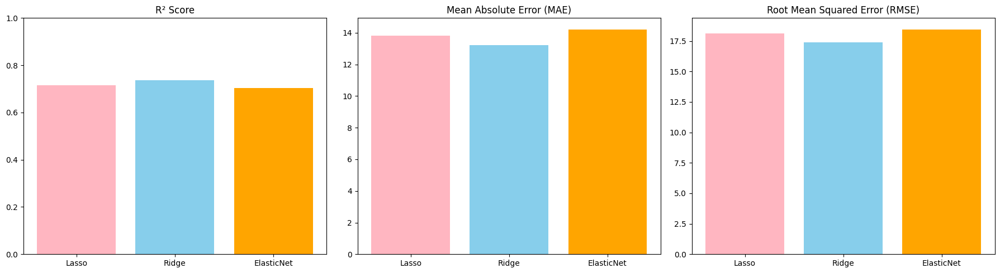

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

metrics = {'Model': [], 'R2 Score': [], 'MAE': [], 'RMSE': []}
for model in ['Lasso', 'Ridge', 'ElasticNet']:
    y_pred = test_predictions[model]

    metrics['Model'].append(model)
    metrics['R2 Score'].append(r2_score(y_test, y_pred))
    metrics['MAE'].append(mean_absolute_error(y_test, y_pred))
    metrics['RMSE'].append(np.sqrt(mean_squared_error(y_test, y_pred)))

colors = ['lightpink', 'skyblue', 'orange']
x_labels = ['Lasso', 'Ridge', 'ElasticNet']

# Create a figure with 3 subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# R² Score
axes[0].bar(x_labels, metrics['R2 Score'], color=colors)
axes[0].set_title('R² Score')
axes[0].set_ylim([0, 1])  # R² is typically between 0 and 1

# MAE
axes[1].bar(x_labels, metrics['MAE'], color=colors)
axes[1].set_title('Mean Absolute Error (MAE)')

# RMSE
axes[2].bar(x_labels, metrics['RMSE'], color=colors)
axes[2].set_title('Root Mean Squared Error (RMSE)')

# Show plot
plt.tight_layout()
plt.show()


### We havent used pca since applying pca have shown no improvements in the results

Original number of features: 81
Optimal number of features to retain 95% variance: 25
Explained variance ratio by components: [0.38931798 0.10482209 0.095212   0.0790773  0.05882183 0.03788369
 0.03622251 0.03107107 0.02361113 0.0197788  0.01828367 0.01458597
 0.01178446 0.00998554 0.00982476 0.00781519 0.00718793 0.00543466
 0.00483327 0.00381677 0.00302273 0.00286552 0.00256483 0.00207111
 0.00197218]
Cumulative explained variance: 0.9818670000443527


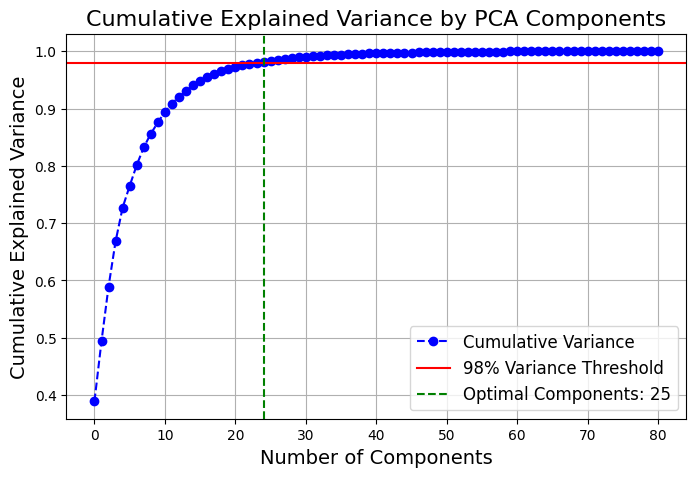

In [ ]:


# Apply PCA to compute explained variance
pca = PCA()
pca.fit(X_scaled)

# Calculate cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Find the number of components needed to retain 95% variance
optimal_components = np.argmax(cumulative_variance >= 0.98) + 1

# Apply PCA with optimal components
pca_optimal = PCA(n_components=optimal_components)
X_pca = pca_optimal.fit_transform(X_scaled)

# Display results
print(f"Original number of features: {X.shape[1]}")
print(f"Optimal number of features to retain 95% variance: {optimal_components}")
print(f"Explained variance ratio by components: {pca_optimal.explained_variance_ratio_}")
print(f"Cumulative explained variance: {cumulative_variance[optimal_components-1]}")

# Plot cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance, marker='o', linestyle='--', color='b', label='Cumulative Variance')
plt.axhline(y=0.98, color='r', linestyle='-', label='98% Variance Threshold')
plt.axvline(x=optimal_components-1, color='g', linestyle='--', label=f'Optimal Components: {optimal_components}')
plt.title('Cumulative Explained Variance by PCA Components', fontsize=16)
plt.xlabel('Number of Components', fontsize=14)
plt.ylabel('Cumulative Explained Variance', fontsize=14)
plt.legend(fontsize=12)
plt.grid()
plt.show()

Summary
---
---

The linear model that best fits the data is linear regreassion, regularized as ridge regression.

Higher degree polynomial and sgd regressor has no effect in improving the efficiency.

Treee based model might be able to improve the accuracy.
